In [50]:
%matplotlib inline

import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.metrics.pairwise import rbf_kernel

sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = (10.0, 10.0)

Kernel K-Means Module

In [51]:
class KernelKMeans:
    def __init__(self, dataset, k, gamma, path):
        self.dataset = dataset
        self.k = k
        self.num = dataset.shape[0]
        self.dim = dataset.shape[1]
        self.df = pd.DataFrame(dataset, columns=['x', 'y'])
        self.path = path
        self.gamma = gamma
        self.gram_matrix = rbf_kernel(dataset, gamma=gamma)
        self.assignments = np.random.randint(k, size=self.num)
    def _plot(self, labels, idx):
        # Check if output directory exists
        if not os.path.isdir(self.path + str(self.gamma)):
            os.makedirs(self.path + str(self.gamma))

        self.df['target'] = labels.astype('int')
        plot = sns.lmplot(x='x', y='y', data=self.df, fit_reg=False, hue='target', legend=False, size=8)
        fig = plot.fig
        fig.suptitle("Iteration {}".format(idx), fontsize=12)
        fig.savefig(self.path + str(self.gamma) + '/{}.png'.format(idx))
    def _compute_dist(self, dist):
        for i in range(self.k):
            mask = (self.assignments == i)
            denom = mask.sum()
            denomq = denom * denom
            
            K = self.gram_matrix[mask][:, mask]
            dist_i = np.sum(K / denomq)
            dist[:, i] += dist_i
            dist[:, i] -= 2 * np.sum(self.gram_matrix[:, mask], axis=1) / denom
        return dist
    def fit(self, init_assign=None):
        if init_assign is not None:
            self.assignments = init_assign
        flag = True
        idx = 0
        dist = np.zeros((self.num, self.k))
#         print(self.assignments)
        while flag:
            self._plot(self.assignments, idx)
            dist.fill(0)
            dist = self._compute_dist(dist)
            assign_old = self.assignments.copy()
            self.assignments = dist.argmin(axis=1)
            n_same = np.sum((self.assignments - assign_old) == 0)
            idx += 1
            if 1 - float(n_same) / self.num == 0:
                flag = False
            if idx == 1000:
                flag = False
        return self.assignments

In [52]:
data = []
with open('./data/circle.txt', 'r') as f:
    for line in f:
        line = line.strip()
        if line == '':
            continue
        x, y = line.split(',')
        data.append([float(x), float(y)])
data = np.array(data)
data.shape

(1500, 2)

/home/dennis/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


[0 0 1 ... 3 0 0]


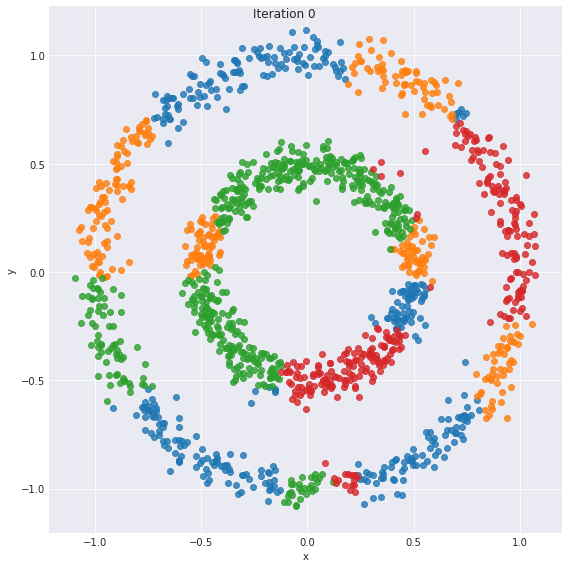

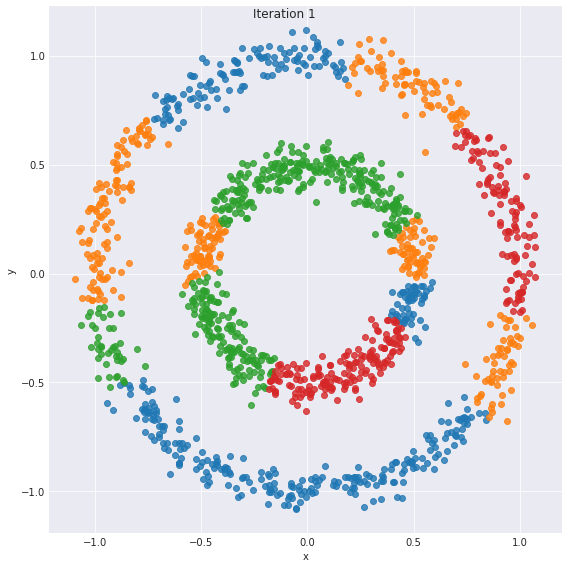

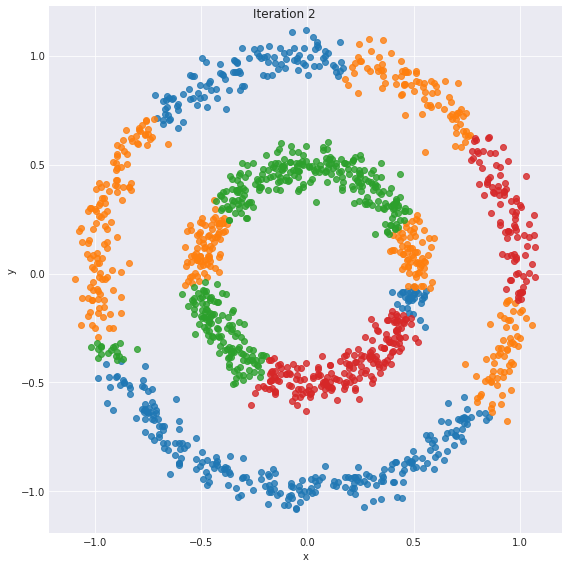

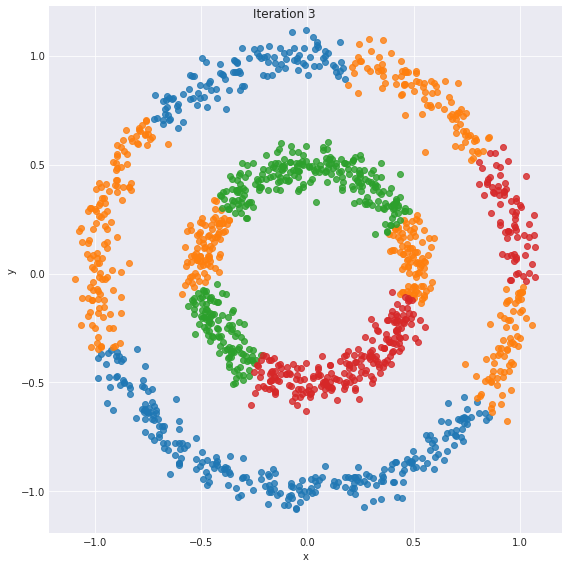

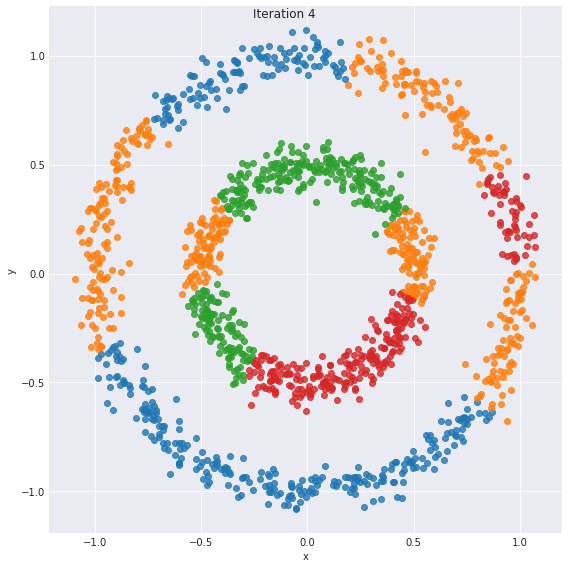

...

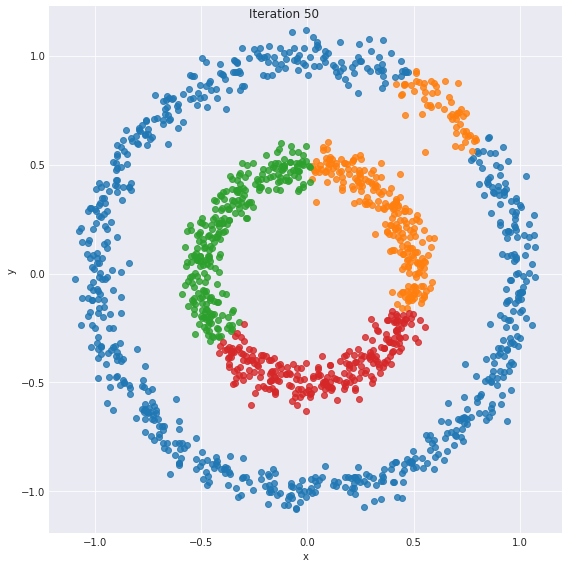

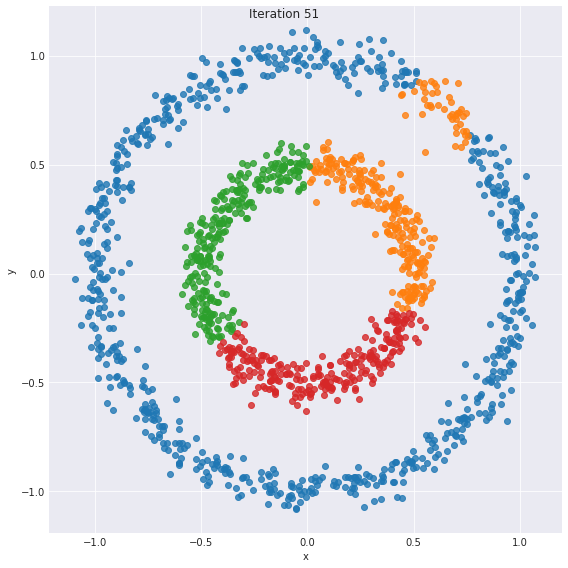

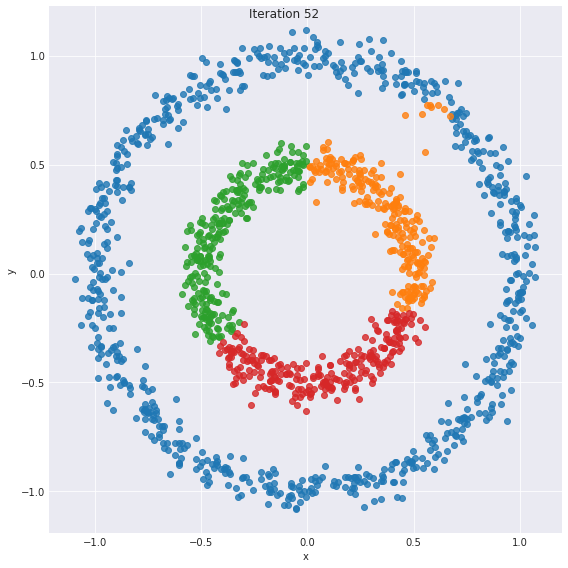

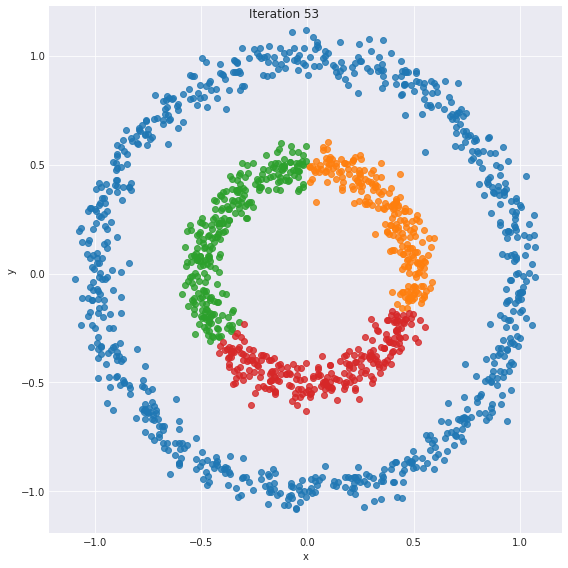

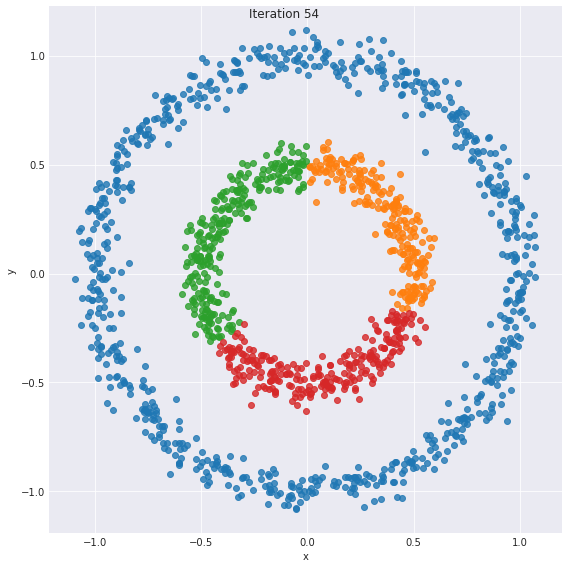

In [27]:
circle_kernel = KernelKMeans(data, 4, 10, './circle-k/c4')
labels = circle_kernel.fit()
print(labels)

better initialization

In [55]:
good_init = np.zeros(data.shape[0], dtype=int)
mask = (data[:, 0]**2 + data[:, 1]**2 < 0.36)
good_init[mask] = 0
good_init[~mask] = 1
good_init[:1250] = np.random.randint(2, size=1250)
good_init

array([1, 1, 1, ..., 0, 1, 1])

[1 1 0 ... 0 1 1]


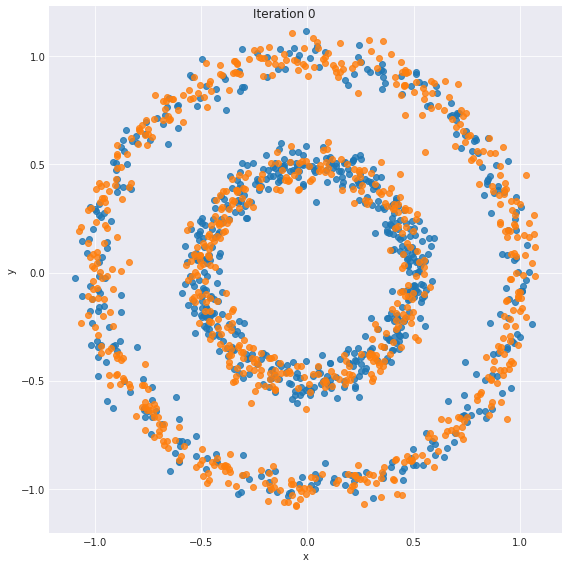

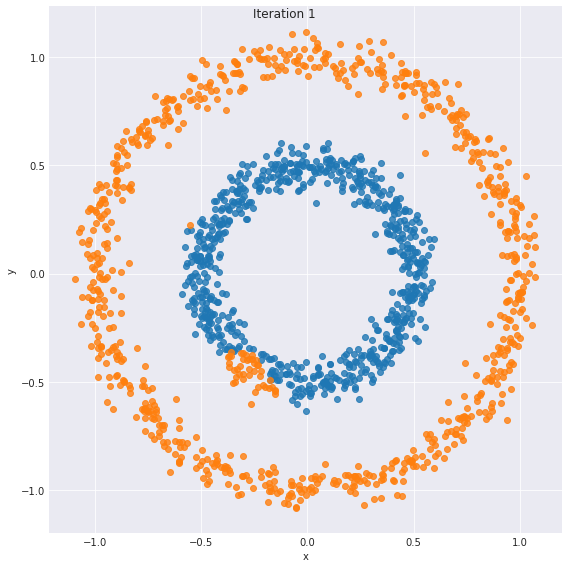

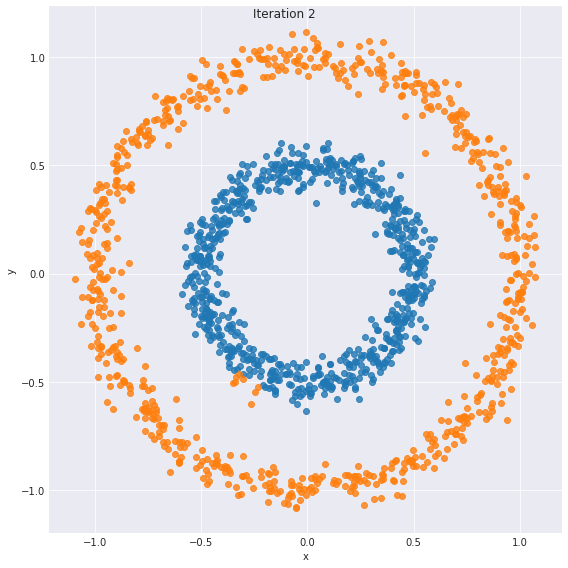

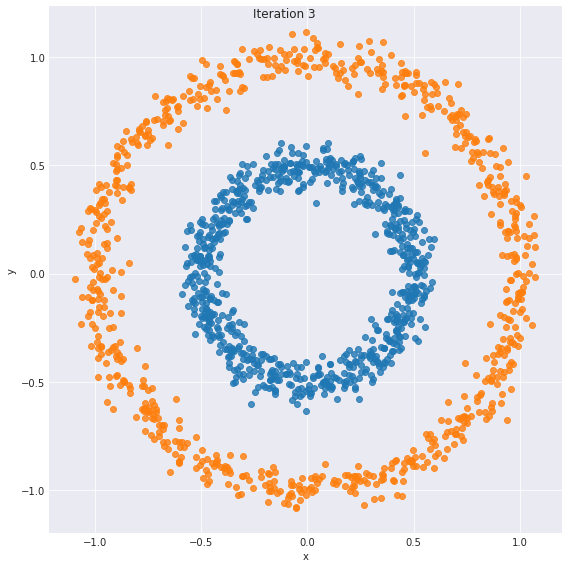

In [56]:
circle_kernel = KernelKMeans(data, 2, 10, './circle-k/good-init')
labels = circle_kernel.fit(init_assign=good_init)
print(labels)

In [57]:
data = []
with open('./data/moon.txt', 'r') as f:
    for line in f:
        line = line.strip()
        if line == '':
            continue
        x, y = line.split(',')
        data.append([float(x), float(y)])
data = np.array(data)
data.shape

(1500, 2)

/home/dennis/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


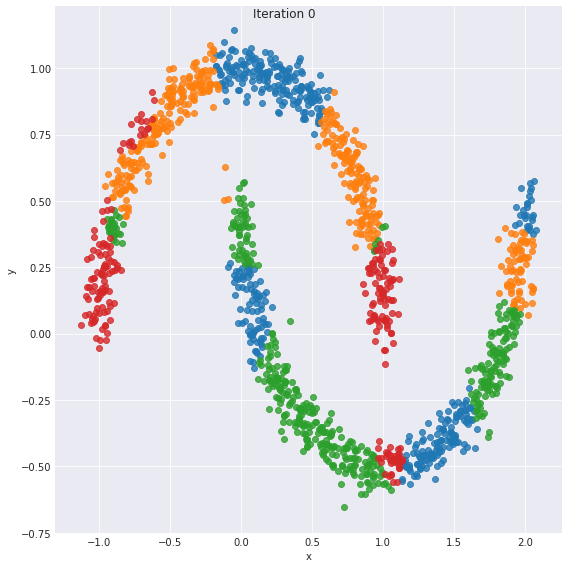

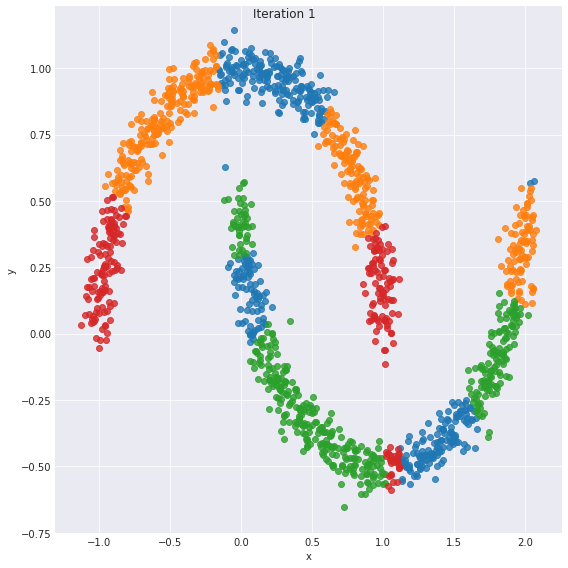

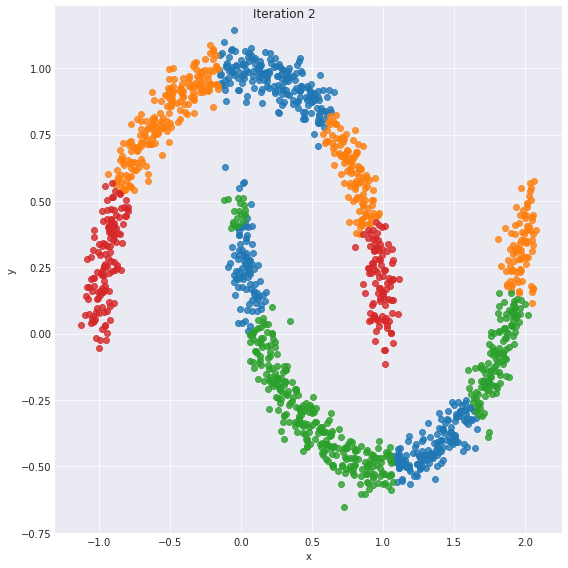

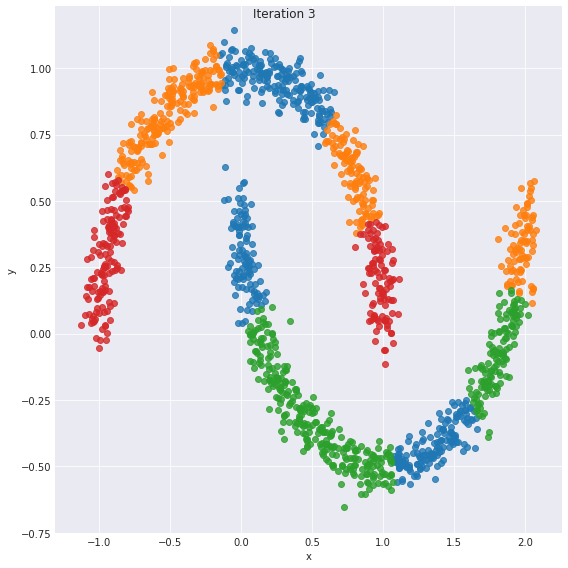

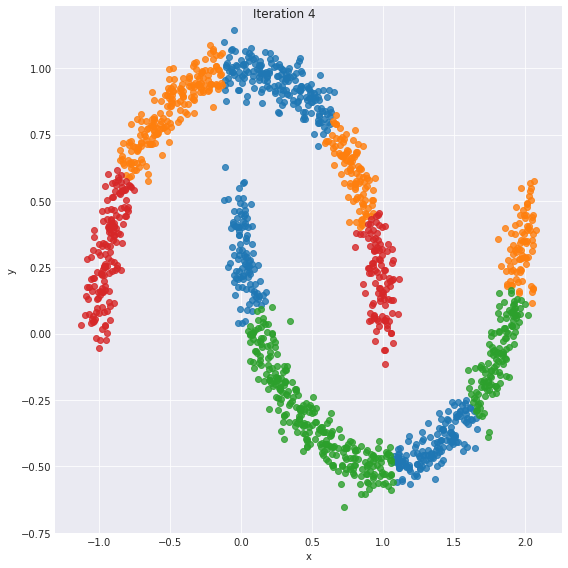

...

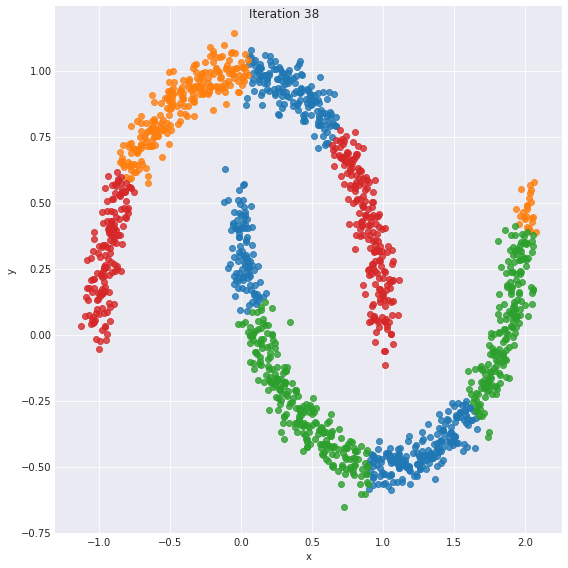

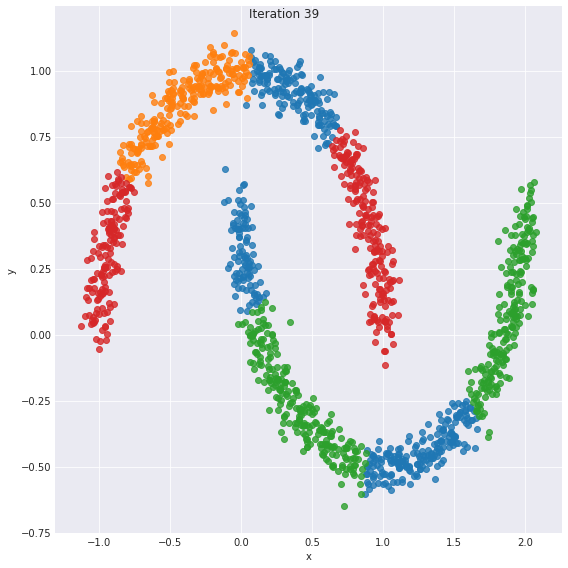

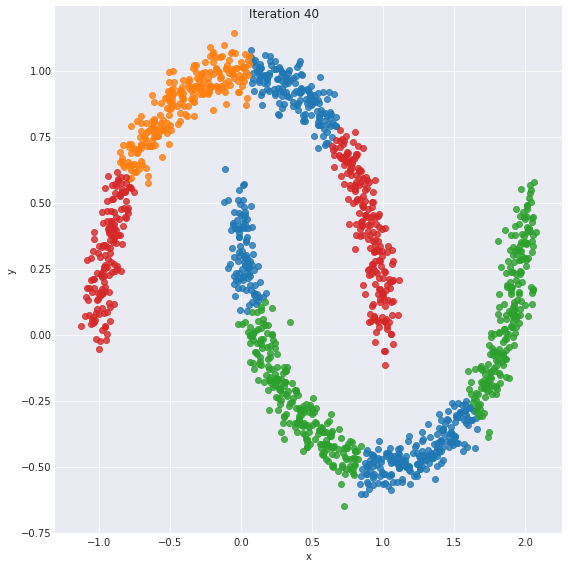

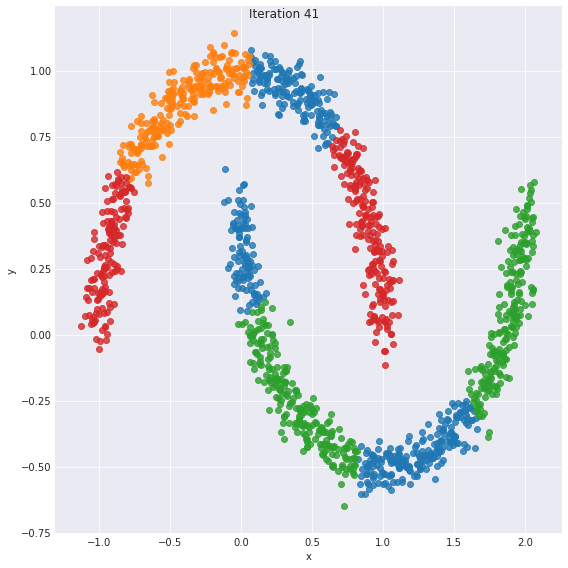

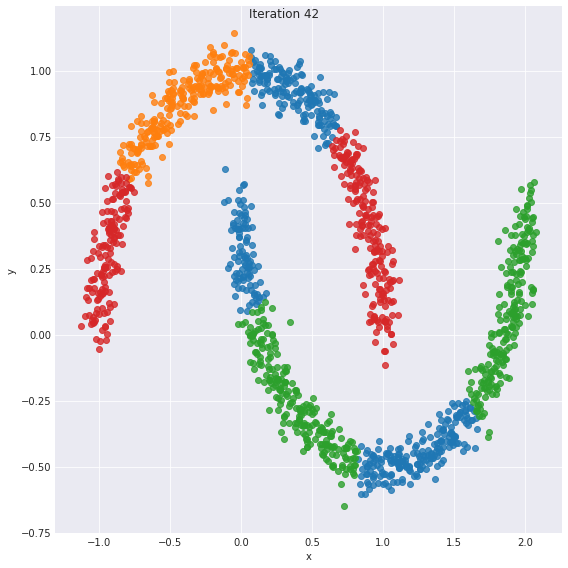

In [30]:
moon_kernel = KernelKMeans(data, 4, 10,'./moon-k/c4')
labels = moon_kernel.fit()

better initailization

In [62]:
good_init = np.random.randint(2, size=data.shape[0])
mask_0 = (data[:, 1] > 0.6)
mask_1 = (data[:, 1] < -0.15)
good_init[mask_0] = 0
good_init[mask_1] = 1
good_init

array([1, 0, 0, ..., 1, 1, 1])

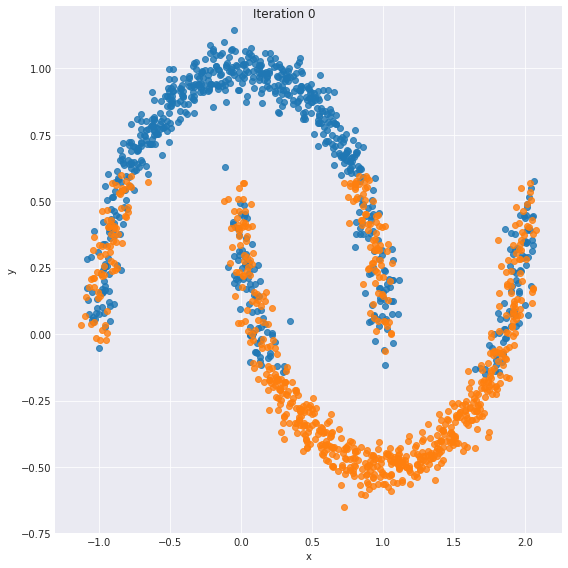

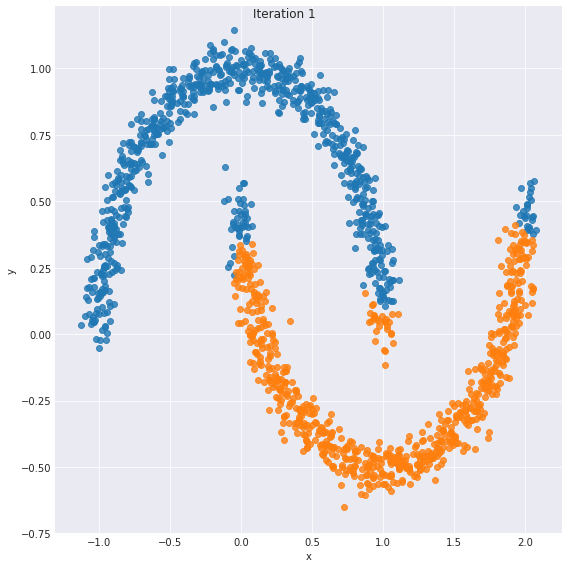

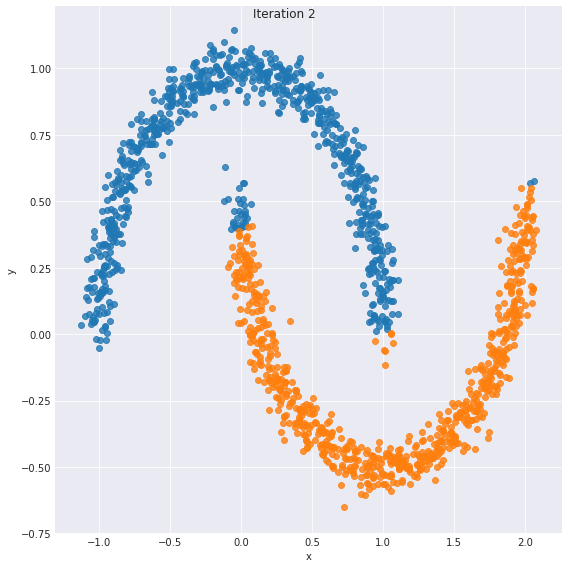

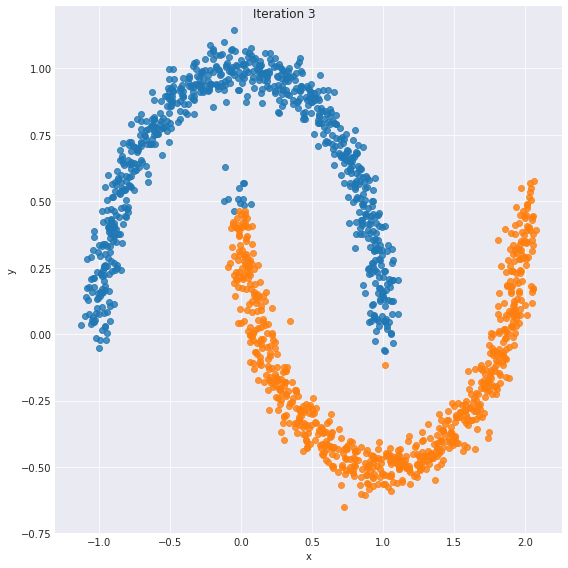

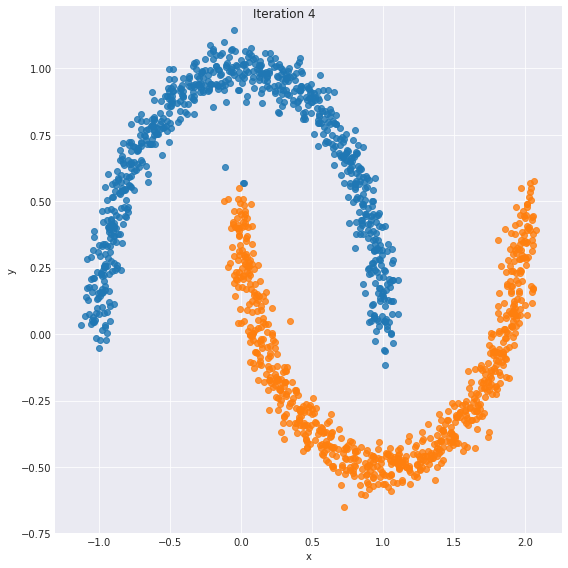

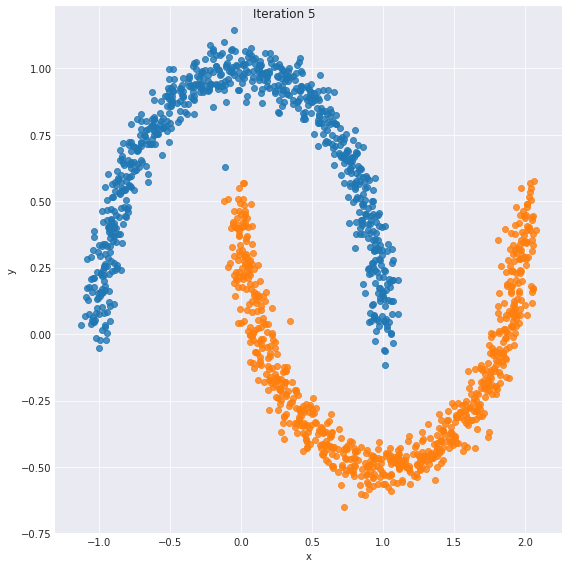

In [63]:
moon_kernel = KernelKMeans(data, 2, 10,'./moon-k/good-init')
labels = moon_kernel.fit(good_init)